In [15]:
if (!require("BiocManager", quietly = TRUE))
    install.packages("BiocManager")

BiocManager::install("GSVA",force = TRUE)

'getOption("repos")' replaces Bioconductor standard repositories, see
'help("repositories", package = "BiocManager")' for details.
Replacement repositories:
    CRAN: https://cran.r-project.org

Bioconductor version 3.16 (BiocManager 1.30.22), R 4.2.3 (2023-03-15)

Installing package(s) 'GSVA'

Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done

Old packages: 'ape', 'argparse', 'backports', 'beachmat', 'BiocManager',
  'boot', 'brew', 'brio', 'broom', 'bslib', 'cachem', 'callr', 'checkmate',
  'cluster', 'codetools', 'credentials', 'data.table', 'dbplyr', 'deldir',
  'DEoptimR', 'dials', 'DiceDesign', 'digest', 'downlit', 'dqrng', 'e1071',
  'farver', 'fastcluster', 'fastmap', 'forecast', 'foreign', 'fracdiff', 'fs',
  'future', 'future.apply', 'gert', 'ggfun', 'ggnewscale', 'ggplot2', 'ggsci',
  'gh', 'globals', 'graphlayouts', 'gtable', 'hardhat', 'highr', 'Hmisc',
  'htmlTable', 'htmltools', 'httr2', 'igraph', 'impute', 'infer', 'interp',
  'KernSmooth',

In [20]:
remotes::install_version("matrixStats", version="1.1.0") #

In [1]:
library(GSVA)
library(GSEABase)
library(Biobase)
library(genefilter)
library(limma)
library(RColorBrewer)
library(msigdbr)

Loading required package: BiocGenerics


Attaching package: ‘BiocGenerics’


The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


The following objects are masked from ‘package:base’:

    anyDuplicated, aperm, append, as.data.frame, basename, cbind,
    colnames, dirname, do.call, duplicated, eval, evalq, Filter, Find,
    get, grep, grepl, intersect, is.unsorted, lapply, Map, mapply,
    match, mget, order, paste, pmax, pmax.int, pmin, pmin.int,
    Position, rank, rbind, Reduce, rownames, sapply, setdiff, sort,
    table, tapply, union, unique, unsplit, which.max, which.min


Loading required package: Biobase

Welcome to Bioconductor

    Vignettes contain introductory material; view with
    'browseVignettes()'. To cite Bioconductor, see
    'citation("Biobase")', and for packages 'citation("pkgname")'.


Loading required package: annotate

Loading required package: AnnotationDbi

Loading required package: stats4

Loading required package: IRanges


#######clustering for CB and NCB in Ever
EverData <- read.csv("../leave_one_out/Expression_log2_21_primaryEver_braun_2020.csv",row.names = 1);
dnames = names(EverData)
EverData <- t(EverData)
EverData <- t(EverData)
names(EverData) <- dnames
dim(EverData)

cgp_gene_sets = msigdbr(species = "human", category = "H")#,subcategory = "GO:CC")
msigdbr_list = split(x = cgp_gene_sets$gene_symbol, f = cgp_gene_sets$gs_name) #ensembl_gene
names(msigdbr_list) <- paste0("p", 1:length(msigdbr_list))
head(msigdbr_list)
#mx.diff=FALSE es值是一个双峰的分布
es.max <- gsva(EverData, msigdbr_list, mx.diff=FALSE, verbose=FALSE, parallel.sz=1,min.sz=5)
#mx.diff=TURE es值是一个近似正态分布
es.dif <- gsva(EverData, msigdbr_list, mx.diff=TRUE, verbose=FALSE, parallel.sz=1,min.sz=5)

pheatmap::pheatmap(es.max)

In [2]:
file_name <- sprintf("motzer.log2.354samples.filter.txt")

file_read = read.csv(file_name,row.names = 1);
file_read <- t(file_read)
head(file_read)

,Xcdaf1a47e636b818a05fc059e5e7362e,Xed91741e1dcf7f5d6daa5266d106db68,X76ebb83ce08b46b79c0ac9188be50566,X4fa2a1b3738de2989fb9621b6895af41,X680a33183fd78f2b9a08c97342f7a9b0,X16f59d5c4921b2ba45f007dabad3cbed,X142598966b9c6f373bd9f077689c67d8,X6f4813ac3666d0bcab8c61a8ac6bec57,Xb847a6787ab5c7701c641462787e3ac0,Xe60a38f89d5f9bf4c9c5eecacb281bda,⋯,X8301d6fe44fd03cc1af1d730ae7938e0,Xe49744bb3cd2750dacc5f87e48c34c34,X4fd2a06a93591162de642a421b33fa77,Xd14fb91b737e78e07ee6622e56539dcd,Xdae1b2a0bb4d7a946c6090f4b63ff3cf,X82e18c17d30609fcaef903843d59d791,X65267ab96e97ada6d44778c6bca9c9e8,X33fe25b1ae7fa2d13b0cebf465cda997,X5f6d56c13a1a7968d5c20cf44c9ed3d9,X5f49414082930ad3d6faa26afe948131
A1BG,1.73552218,1.11769504,1.26303441,1.28095631,1.89530262,1.55581616,1.84799691,3.17472599,1.54101915,3.51349075,⋯,1.76553475,1.21412481,1.95977016,1.73984810,1.25701062,1.02856915,1.03562391,1.59931779,1.69153416,1.92219785
A1BG.AS1,1.58496250,0.63226822,0.76553475,1.40599236,1.60407132,1.07724300,1.66448284,0.87184365,1.82781902,1.65076456,⋯,1.59454855,0.56559718,2.18586655,1.00000000,0.21412481,0.01435529,0.12432814,0.81557543,1.44890095,1.65076456
A1CF,1.38404981,2.06695024,0.74846123,0.11103131,2.26603689,0.01435529,0.01435529,2.42492209,0.13750352,2.87970577,⋯,2.22342255,0.01435529,2.01792191,0.01435529,1.31614574,0.01435529,0.01435529,2.26002566,0.01435529,1.56071495
A2M,3.50969584,3.04788733,3.21723072,3.48800077,3.44493205,3.31179372,3.39917109,3.24031433,3.65076456,3.49952702,⋯,3.42760617,3.41683974,3.46988598,3.45154083,3.41142625,3.32912360,3.40871186,3.45285896,3.24640809,3.50716035
A2M.AS1,1.70929064,1.67355642,1.02856915,1.07038933,1.29865832,0.94110631,1.79908731,0.29865832,1.64154603,1.09085343,⋯,1.16992500,1.07724300,1.09085343,1.88362082,1.86789646,1.76977174,1.14404637,1.97085365,1.07724300,1.52606881
A2ML1,0.01435529,0.01435529,0.01435529,0.01435529,0.01435529,0.01435529,0.01435529,0.01435529,0.01435529,0.01435529,⋯,0.01435529,0.01435529,0.01435529,0.01435529,0.01435529,0.01435529,0.01435529,0.01435529,0.01435529,0.01435529


In [3]:
cgp_gene_sets = msigdbr(species = "human", category = "C2",subcategory="KEGG")#,subcategory = "GO:CC")
msigdbr_list = split(x = cgp_gene_sets$gene_symbol, f = cgp_gene_sets$gs_name)
head(msigdbr_list) 

$KEGG_ABC_TRANSPORTERS
 [1] "ABCA1"  "ABCA10" "ABCA12" "ABCA13" "ABCA2"  "ABCA3"  "ABCA4"  "ABCA5" 
 [9] "ABCA6"  "ABCA7"  "ABCA8"  "ABCA9"  "ABCB1"  "ABCB10" "ABCB11" "ABCB11"
[17] "ABCB4"  "ABCB5"  "ABCB6"  "ABCB7"  "ABCB8"  "ABCB9"  "ABCC1"  "ABCC1" 
[25] "ABCC10" "ABCC11" "ABCC12" "ABCC2"  "ABCC3"  "ABCC4"  "ABCC5"  "ABCC6" 
[33] "ABCC6"  "ABCC8"  "ABCC9"  "ABCD1"  "ABCD2"  "ABCD3"  "ABCD4"  "ABCG1" 
[41] "ABCG2"  "ABCG4"  "ABCG5"  "ABCG8"  "CFTR"   "TAP1"   "TAP1"   "TAP1"  
[49] "TAP1"   "TAP1"   "TAP1"   "TAP1"   "TAP1"   "TAP2"   "TAP2"   "TAP2"  
[57] "TAP2"   "TAP2"   "TAP2"   "TAP2"   "TAP2"  

$KEGG_ACUTE_MYELOID_LEUKEMIA
 [1] "AKT1"     "AKT2"     "AKT3"     "AKT3"     "ARAF"     "BAD"     
 [7] "BRAF"     "CCNA1"    "CCND1"    "CEBPA"    "CHUK"     "EIF4EBP1"
[13] "FLT3"     "GRB2"     "HRAS"     "HRAS"     "IKBKB"    "IKBKG"   
[19] "JUP"      "KIT"      "KRAS"     "LEF1"     "MAP2K1"   "MAP2K2"  
[25] "MAPK1"    "MAPK3"    "MTOR"     "MYC"      "NFKB1"    "NRAS"    
[31] "PIK3CA"   "PIK3CB"   "PIK3CD"   "PIK3CG"   "PIK3R1"   "PIK3R2"  
[37] "PIK3R3"   "PIK3R5"   "PIM1"     "PIM2"     "PML"      "PPARD"   
[43] "RAF1"     "RARA"     "RELA"     "RPS6KB1"  "RPS6KB2"  "RUNX1"   
[49] "RUNX1T1"  "SOS1"     "SOS2"     "SPI1"     "STAT3"    "STAT5A"  
[55] "STAT5B"   "TCF7"     "TCF7L1"   "TCF7L2"   "ZBTB16"  

$KEGG_ADHERENS_JUNCTION
 [1] "ACP1"    "ACTB"    "ACTG1"   "ACTN1"   "ACTN2"   "ACTN3"   "ACTN4"  
 [8] "ACTN4"   "AFDN"    "BAIAP2"  "CDC42"   "CDH1"    "CREBBP"  "CSNK2A1"
[15] "CSNK2A2" "CSNK2B"  "CSNK2B"  "CSNK2B"  "CSNK2B"  "CSNK2B"  "CSNK2B" 
[22] "CSNK2B"  "CSNK2B"  "CTNNA1"  "CTNNA2"  "CTNNA3"  "CTNNB1"  "CTNND1" 
[29] "EGFR"    "EP300"   "ERBB2"   "FARP2"   "FER"     "FGFR1"   "FYN"    
[36] "IGF1R"   "INSR"    "IQGAP1"  "LEF1"    "LMO7"    "MAP3K7"  "MAPK1"  
[43] "MAPK3"   "MET"     "NECTIN1" "NECTIN2" "NECTIN3" "NECTIN4" "NLK"    
[50] "PARD3"   "PTPN1"   "PTPN6"   "PTPRB"   "PTPRF"   "PTPRJ"   "PTPRM"  
[57] "RAC1"    "RAC2"    "RAC3"    "RHOA"    "SMAD2"   "SMAD3"   "SMAD4"  
[64] "SNAI1"   "SNAI2"   "SORBS1"  "SRC"     "SSX2IP"  "TCF7"    "TCF7L1" 
[71] "TCF7L2"  "TGFBR1"  "TGFBR2"  "TJP1"    "TJP1"    "VCL"     "WAS"    
[78] "WASF1"   "WASF2"   "WASF3"   "WASL"    "YES1"   

$KEGG_ADIPOCYTOKINE_SIGNALING_PATHWAY
 [1] "ACACB"    "ACSL1"    "ACSL3"    "ACSL4"    "ACSL5"    "ACSL6"   
 [7] "ADIPOQ"   "ADIPOR1"  "ADIPOR2"  "ADIPOR2"  "AGRP"     "AKT1"    
[13] "AKT2"     "AKT3"     "AKT3"     "CAMKK1"   "CAMKK2"   "CD36"    
[19] "CHUK"     "CPT1A"    "CPT1B"    "CPT1C"    "G6PC1"    "G6PC2"   
[25] "G6PC2"    "IKBKB"    "IKBKG"    "IRS1"     "IRS2"     "IRS4"    
[31] "JAK2"     "LEP"      "LEPR"     "MAPK10"   "MAPK8"    "MAPK9"   
[37] "MTOR"     "NFKB1"    "NFKBIA"   "NFKBIB"   "NFKBIB"   "NFKBIE"  
[43] "NPY"      "PCK1"     "PCK2"     "PCK2"     "POMC"     "PPARA"   
[49] "PPARGC1A" "PRKAA1"   "PRKAA2"   "PRKAB1"   "PRKAB2"   "PRKAG1"  
[55] "PRKAG2"   "PRKAG3"   "PRKCQ"    "PTPN11"   "RELA"     "RXRA"    
[61] "RXRB"     "RXRB"     "RXRB"     "RXRB"     "RXRB"     "RXRB"    
[67] "RXRG"     "SLC2A1"   "SLC2A4"   "SLC2A4"   "SOCS3"    "STAT3"   
[73] "STK11"    "TNF"      "TNF"      "TNF"      "TNF"      "TNF"     
[79] "TNF"      "TNF"      "TNF"      "TNFRSF1A" "TNFRSF1B" "TRADD"   
[85] "TRAF2"   

$KEGG_ALANINE_ASPARTATE_AND_GLUTAMATE_METABOLISM
 [1] "ABAT"    "ACY3"    "ADSL"    "ADSS1"   "ADSS2"   "AGXT"    "AGXT2"  
 [8] "ALDH4A1" "ALDH5A1" "ASL"     "ASNS"    "ASPA"    "ASS1"    "CAD"    
[15] "CPS1"    "DDO"     "GAD1"    "GAD2"    "GFPT1"   "GFPT2"   "GLS"    
[22] "GLS2"    "GLUD1"   "GLUD2"   "GLUD2"   "GLUL"    "GOT1"    "GOT2"   
[29] "GPT"     "GPT2"    "IL4I1"   "NIT2"    "PPAT"   

$KEGG_ALDOSTERONE_REGULATED_SODIUM_REABSORPTION
 [1] "ATP1A1"   "ATP1A2"   "ATP1A3"   "ATP1A4"   "ATP1B1"   "ATP1B2"  
 [7] "ATP1B3"   "ATP1B4"   "FXYD2"    "FXYD4"    "HSD11B1"  "HSD11B2" 
[13] "IGF1"     "INS"      "INSR"     "IRS1"     "IRS2"     "IRS4"    
[19] "KCNJ1"    "KRAS"     "MAPK1"    

In [7]:
# 前者是高斯分布 kcdf=Gaussian (suitable for FPKM)，后者是二项式分布 kcdf=Poisson (suitable for RNA-seq alignment count)
#names(msigdbr_list) <- paste0("p", 1:length(msigdbr_list))

#高斯分布 kcdf=Gaussian
#method: plage, zscore, ssgsea, gsva
es.max <- gsva(file_read, method = "gsva"
               ,msigdbr_list, mx.diff=FALSE, verbose=FALSE, parallel.sz=1,min.sz=5)
#for reads counts / mx.diff=FALSE es值是一个双峰的分布 
#es.dif <- gsva(primNivoData, msigdbr_list, mx.diff=TRUE, verbose=FALSE, parallel.sz=1,min.sz=5)

cate <- "354-pd-L1"
write.table(es.max, 
            file = sprintf("gsva_c2kegg_pathway_%s.txt", cate), sep = "\t",
            row.names = TRUE, col.names = TRUE)

Warning message:
“useNames = NA is deprecated. Instead, specify either useNames = TRUE or useNames = FALSE.”
Warning message in .filterFeatures(expr, method):
“230 genes with constant expression values throuhgout the samples.”
Warning message in .filterFeatures(expr, method):
“Since argument method!="ssgsea", genes with constant expression values are discarded.”


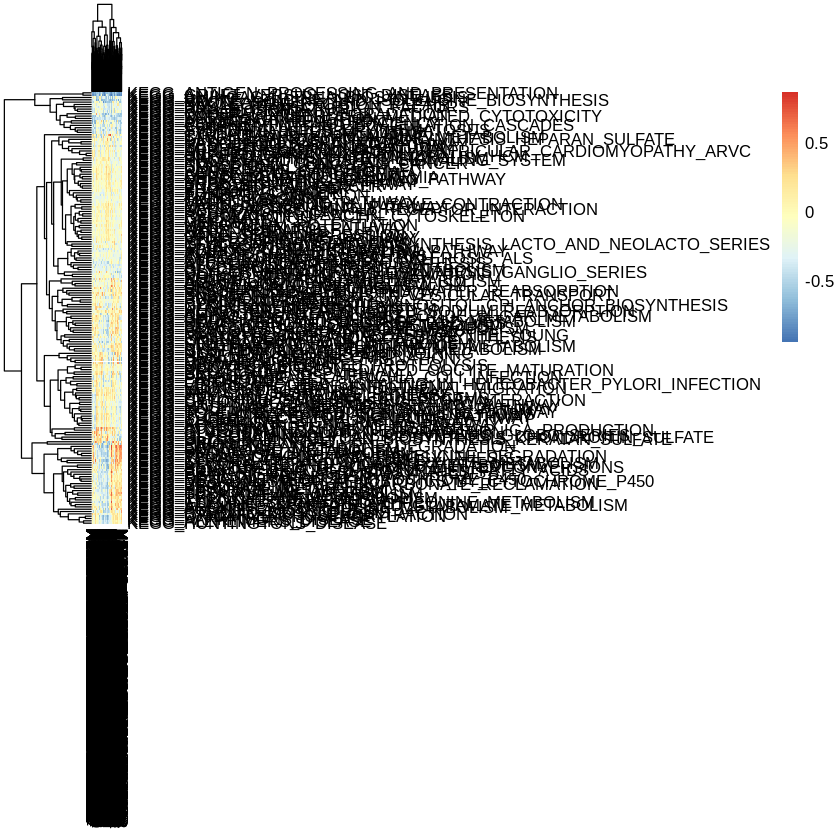

In [6]:
pheatmap::pheatmap(es.max)
#pheatmap::pheatmap(es.dif)